# Imports

In [1]:
# standard libraries
import numpy as np
import pandas as pd

# geographic plotting
import geopandas as gpd
import json

# visualization
import altair as alt

# other
import requests

In [2]:
# enable altair visualizations
alt.renderers.enable()

# opaque background
alt.themes.enable('opaque')

ThemeRegistry.enable('opaque')

In [3]:
alt.__version__

'2.4.1'

# Load Atlanta Crime Data

In [4]:
df = pd.read_csv('COBRA-2009-2018.csv')
df['Beat'] = df['Beat'].fillna(0).astype('uint32')

C:\Users\Jake\Anaconda3\envs\mainenv\lib\site-packages\IPython\core\interactiveshell.py:3020: DtypeWarning: Columns (11) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


# Transform Dates

In [5]:
df['Date'] =  pd.to_datetime(df['Occur Date'])

In [6]:
# create function to extract datetime features
def date_extraction(feature):
    month_list = []
    day_list = []  
    day_of_week_list = []
    day_of_year_list = []
    year_list = []
    
  
    for i in feature:
        month_list.append(i.month)
        day_list.append(i.day)
        day_of_week_list.append(i.dayofweek)
        day_of_year_list.append(i.dayofyear)
        year_list.append(i.year)
    
    return month_list, day_list, day_of_week_list, day_of_year_list, year_list

In [7]:
df['Month'] = date_extraction(df['Date'])[0]
df['Day'] = date_extraction(df['Date'])[1]
df['Day_of_week'] = date_extraction(df['Date'])[2]
df['Day_of_year'] = date_extraction(df['Date'])[3]
df['Year'] = date_extraction(df['Date'])[4]

# Geograhpic and Mapping Data

In [52]:
# shape_file_loc = "atlanta_shape//Neighborhoods.shp"

In [8]:
geo_json_file_loc = "https://opendata.arcgis.com/datasets/297d3d69d8ab4c6ba5f9264ad5e75c0a_3.geojson"

In [9]:
def download_json():
    '''Downloads ANC JSON from Open Data DC'''
    url =  "https://opendata.arcgis.com/datasets/297d3d69d8ab4c6ba5f9264ad5e75c0a_3.geojson"
    resp = requests.get(url)
    return resp.json()

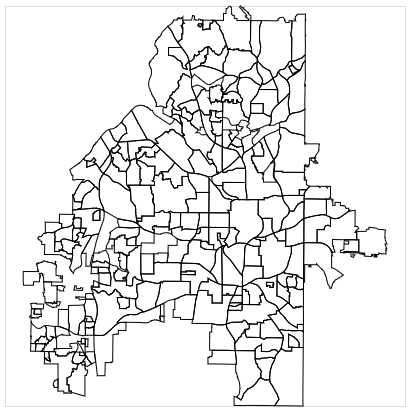

In [10]:
def gen_base(geojson):
    '''Generates baselayer of DC ANC map'''
    base = alt.Chart(alt.Data(values=geojson)).mark_geoshape(
        stroke='black',
        strokeWidth=1
    ).encode(
    ).properties(
        width=400,
        height=400
    )
    return base

json_file = download_json()
base_layer = gen_base(geojson=json_file)
base_layer

In [11]:
# Convert GeoJSON to Geopandas Dataframe 
gdf = gpd.GeoDataFrame.from_features((json_file))

In [12]:
pop_df = pd.read_csv('ATL_NB_Pop_Data.csv')

In [13]:
gdf2 = gdf.merge(pop_df, left_on="NAME", right_on="NEIGHBORHO", how='inner')
gdf2 = gdf2.drop(['ACRES_x', 'Unnamed: 0'], axis=1)

# Create Dataframes for Years

In [8]:
# df_2018 = df[df['Year'] == 2018]
# df_2017 = df[df['Year'] == 2017]
# df_2016 = df[df['Year'] == 2016]
# df_2015 = df[df['Year'] == 2015]

In [14]:
# dfs = [df_2015, df_2016, df_2017, df_2018]
dfs = ['df_2015', 'df_2016', 'df_2017', 'df_2018']
years = [2015, 2016, 2017, 2018]

In [15]:
crime_list = ['AGG ASSAULT', 'AUTO THEFT', 'BURGLARY-NONRES', 'BURGLARY-RESIDENCE',
              'HOMICIDE', 'LARCENY-FROM VEHICLE', 'LARCENY-NON VEHICLE', 
              'MANSLAUGHTER', 'ROBBERY-COMMERCIAL', 'ROBBERY-PEDESTRIAN','ROBBERY-RESIDENCE']

In [16]:
rate_list = []

for i in crime_list:
    rate_list.append(i.title() + " Rate")
    
rate_list    

['Agg Assault Rate',
 'Auto Theft Rate',
 'Burglary-Nonres Rate',
 'Burglary-Residence Rate',
 'Homicide Rate',
 'Larceny-From Vehicle Rate',
 'Larceny-Non Vehicle Rate',
 'Manslaughter Rate',
 'Robbery-Commercial Rate',
 'Robbery-Pedestrian Rate',
 'Robbery-Residence Rate']

In [ ]:
# for i, j in zip(rate_list, crime_list):
#     viz_df[i] = np.round(viz_df[j] * viz_df['Pop_100K_Adj'], 2)

In [17]:
# d['df_2018']['MANSLAUGHTER']

In [18]:
d = {}
for num in years:
    d["df_" + str(num)] = df[df['Year'] == num].pivot_table(index=['Neighborhood'], values= ['NPU'], columns=['UCR Literal'], aggfunc='size', fill_value=0)
    
    d["df_" + str(num)] = gdf2.merge(d["df_" + str(num)], left_on="NAME", right_on="Neighborhood", how='outer')
    
    d["df_" + str(num)]['centroid_lon'] = d["df_" + str(num)]['geometry'].centroid.x
    d["df_" + str(num)]['centroid_lat'] = d["df_" + str(num)]['geometry'].centroid.y
    
    d["df_" + str(num)]['Pop_100K_Adj'] = 100000 / d["df_" + str(num)]['EST_POP'] 
    



In [19]:
for i, j in zip(rate_list, crime_list):
    d["df_" + str(num)][i] = np.round(d["df_" + str(num)][j] * d["df_" + str(num)]['Pop_100K_Adj'], 2)

In [77]:
# for i in dfs:
#     i = d[i].pivot_table(index=['Neighborhood'], values= ['NPU'], columns=['UCR Literal'], aggfunc='size', fill_value=0)
#     list_of_dfs.append(i)

In [51]:
# df_2018 = df_2018.pivot_table(index=['Neighborhood'], values= ['NPU'], columns=['UCR Literal'], aggfunc='size', fill_value=0)
# df_2017 = df_2017.pivot_table(index=['Neighborhood'], values= ['NPU'], columns=['UCR Literal'], aggfunc='size', fill_value=0)
# df_2016 = df_2016.pivot_table(index=['Neighborhood'], values= ['NPU'], columns=['UCR Literal'], aggfunc='size', fill_value=0)
# df_2015 = df_2015.pivot_table(index=['Neighborhood'], values= ['NPU'], columns=['UCR Literal'], aggfunc='size', fill_value=0)

# Data Transformations

In [36]:
# viz_df['Pop_100K_Adj'] = 100000 / viz_df['EST_POP'] 

['Agg Assault Rate',
 'Auto Theft Rate',
 'Burglary-Nonres Rate',
 'Burglary-Residence Rate',
 'Homicide Rate',
 'Larceny-From Vehicle Rate',
 'Larceny-Non Vehicle Rate',
 'Manslaughter Rate',
 'Robbery-Commercial Rate',
 'Robbery-Pedestrian Rate',
 'Robbery-Residence Rate']

In [38]:
for i, j in zip(rate_list, crime_list):
    viz_df[i] = np.round(viz_df[j] * viz_df['Pop_100K_Adj'], 2)

In [39]:
viz_df.head()

,CREATED_DATE,CREATED_USER,EFFECTDATE,ENDDATE,FULLFIPS,GEOTYPE,GLOBALID,LAST_EDITED_DATE,LAST_EDITED_USER,LEGALAREA,...,Auto Theft Rate,Burglary-Nonres Rate,Burglary-Residence Rate,Homicide Rate,Larceny-From Vehicle Rate,Larceny-Non Vehicle Rate,Manslaughter Rate,Robbery-Commercial Rate,Robbery-Pedestrian Rate,Robbery-Residence Rate
0,None,None,None,None,None,Neighborhood,{0F0F81DD-5048-41DF-976F-9D82C35C6B0D},2018-11-01T13:22:37.000Z,GIS,None,...,445.41,36.11,180.57,12.04,2455.76,493.56,0.0,0.00,24.08,12.04
1,None,None,None,None,None,Neighborhood,{574B2215-C2CA-4719-B687-D6FA8D201AAC},2018-11-01T14:25:05.000Z,GIS,None,...,490.10,137.23,705.74,0.00,2195.65,705.74,0.0,137.23,313.66,0.00
2,None,None,None,None,None,Neighborhood,{3457E2EB-86D1-4E12-B2B0-194AD6A4FFC5},2018-11-01T13:42:11.000Z,GIS,None,...,320.51,64.10,102.56,0.00,2076.92,358.97,0.0,0.00,89.74,25.64
3,None,None,None,None,None,Neighborhood,{933AD6B6-681B-4748-8268-7F6C957FE691},2018-05-15T13:24:10.000Z,GIS,None,...,504.52,142.79,371.25,19.04,2217.99,1542.12,0.0,0.00,123.75,57.12
4,None,None,None,None,None,Neighborhood,{2B63D8A7-D37E-42E1-B0FC-7108E65264AF},2018-05-15T13:24:10.000Z,GIS,None,...,538.36,0.00,672.95,0.00,269.18,538.36,0.0,0.00,134.59,0.00


# Build Maps

In [40]:
choro_json = json.loads(viz_df.to_json())
choro_data = alt.Data(values=choro_json['features'])

In [41]:
viz_df.columns

Index(['CREATED_DATE', 'CREATED_USER', 'EFFECTDATE', 'ENDDATE', 'FULLFIPS',
       'GEOTYPE', 'GLOBALID', 'LAST_EDITED_DATE', 'LAST_EDITED_USER',
       'LEGALAREA', 'LOCALID', 'NAME', 'NPU_x', 'OBJECTID_x', 'OLDNAME',
       'SQMILES', 'SRCREF', 'geometry', 'OBJECTID_y', 'NPU_y', 'STATISTICA',
       'POP2010', 'EST_POP', 'ACRES_y', 'Acres_NB_ID', 'Pop_per_Acre',
       'Imputed_Pop', 'High_Uncertainty', 'NEIGHBORHO', 'URL', 'pop', 'white',
       'black', 'asian', 'other', 'hispanic', 'GlobalID', 'last_edited_date',
       'AGG ASSAULT', 'AUTO THEFT', 'BURGLARY-NONRES', 'BURGLARY-RESIDENCE',
       'HOMICIDE', 'LARCENY-FROM VEHICLE', 'LARCENY-NON VEHICLE',
       'MANSLAUGHTER', 'ROBBERY-COMMERCIAL', 'ROBBERY-PEDESTRIAN',
       'ROBBERY-RESIDENCE', 'centroid_lon', 'centroid_lat', 'Pop_100K_Adj',
       'Agg Assault Rate', 'Auto Theft Rate', 'Burglary-Nonres Rate',
       'Burglary-Residence Rate', 'Homicide Rate', 'Larceny-From Vehicle Rate',
       'Larceny-Non Vehicle Rate', 'Mans

In [43]:
# def gen_map(geodata, color_column, title):
#     '''Generates DC ANC map with population choropleth and ANC labels'''
#     # Add Base Layer
#     base = alt.Chart(geodata, title = title).mark_geoshape(
#         stroke='black',
#         strokeWidth=1
#     ).encode(
#     ).properties(
#         width=800,
#         height=800
#     )
#     # Add Choropleth Layer
#     choro = alt.Chart(geodata).mark_geoshape(
#         fill='lightgray',
#         stroke='black'
#     ).encode(
#         alt.Color(color_column, 
#                   type='quantitative', 
#                   scale=alt.Scale(scheme='bluegreen'),
#                   title = "DC Population")
#     )
#     # Add Labels Layer
#     labels = alt.Chart(geodata).mark_text(baseline='top'
#      ).properties(
#         width=800,
#         height=800
#      ).encode(
#          longitude='properties.centroid_lon:Q',
#          latitude='properties.centroid_lat:Q',
#          text='properties.NAME:O',
#          size=alt.value(8),
#          opacity=alt.value(1)
#      )

#     return base + choro + labels

# pop_2000_map = gen_map(geodata=choro_data, color_column='properties.HOMICIDE', title='2000')
# pop_2000_map

In [42]:
def gen_map(geodata, color_column, title, tooltip, color_scheme='bluegreen'):
    '''
    Generates Toronto neighbourhoods map with building count choropleth
    '''
    
    # Add Base Layer
    base = alt.Chart(alt.Data(values=json_file)).mark_geoshape(
        stroke='black',
        strokeWidth=1
    ).encode(
    ).properties(
        title=title,
        width=700,
        height=700
    )
    # Add Choropleth Layer
    choro = alt.Chart(geodata).mark_geoshape(
        fill='lightgray',
        stroke='black'
    ).encode(
        alt.Color(color_column, sort="descending",
                  type='quantitative', 
                  scale=alt.Scale(scheme=color_scheme),
                  title = "Rate per 100K"),
         tooltip=tooltip
    )
    
    config = alt.layer(base, choro).configure_title(fontSize=20, anchor="middle").configure_legend(titleColor='black', titleFontSize=14) 
    
    return config
#     return base

In [43]:
rate_list

['Agg Assault Rate',
 'Auto Theft Rate',
 'Burglary-Nonres Rate',
 'Burglary-Residence Rate',
 'Homicide Rate',
 'Larceny-From Vehicle Rate',
 'Larceny-Non Vehicle Rate',
 'Manslaughter Rate',
 'Robbery-Commercial Rate',
 'Robbery-Pedestrian Rate',
 'Robbery-Residence Rate']

In [44]:
def create_map_json(feature):
    json_map = gen_map(geodata=choro_data, color_column='properties.' + feature, 
                      title=feature + 'by Neighborhood (2018)', tooltip=[alt.Tooltip('properties.NAME:O', title="Neighborhood"), alt.Tooltip('properties.' + feature+ ':Q', title=feature)], 
                      color_scheme='viridis')
    
    
    json_map.save(feature + '.json')

In [46]:
for i in rate_list:
    create_map_json(i)

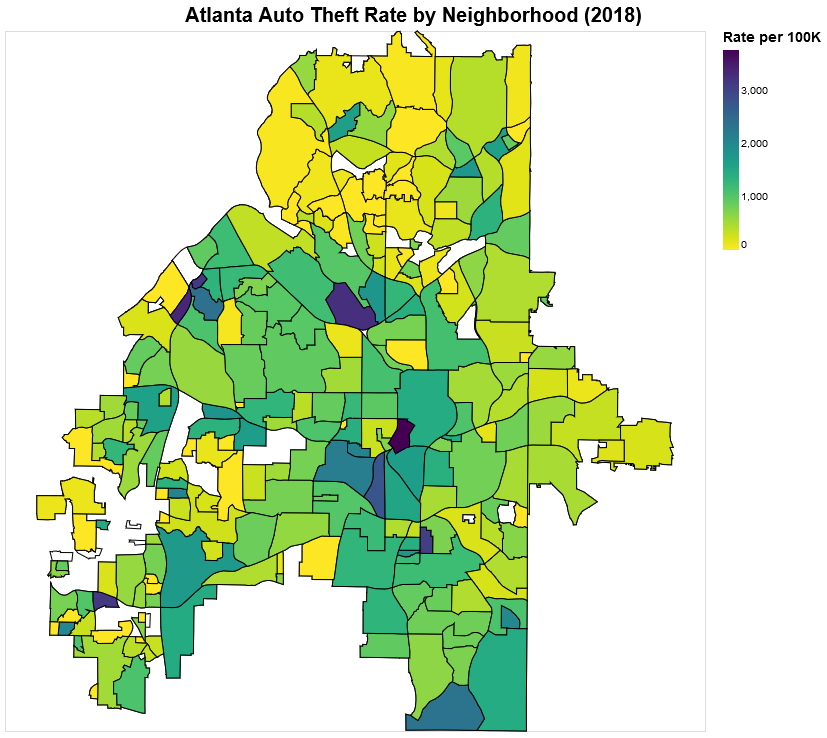

In [48]:
auto_theft_map = gen_map(geodata=choro_data, color_column='properties.Auto Theft Rate', 
                      title='Atlanta Auto Theft Rate by Neighborhood (2018)', tooltip=[alt.Tooltip('properties.NAME:O', title="Neighborhood"), alt.Tooltip('properties.Auto Theft Rate:Q', title="Auto Theft Rate")], 
                      color_scheme='viridis')

auto_theft_map

In [51]:
auto_theft_map.save('auto_theft_map.json')

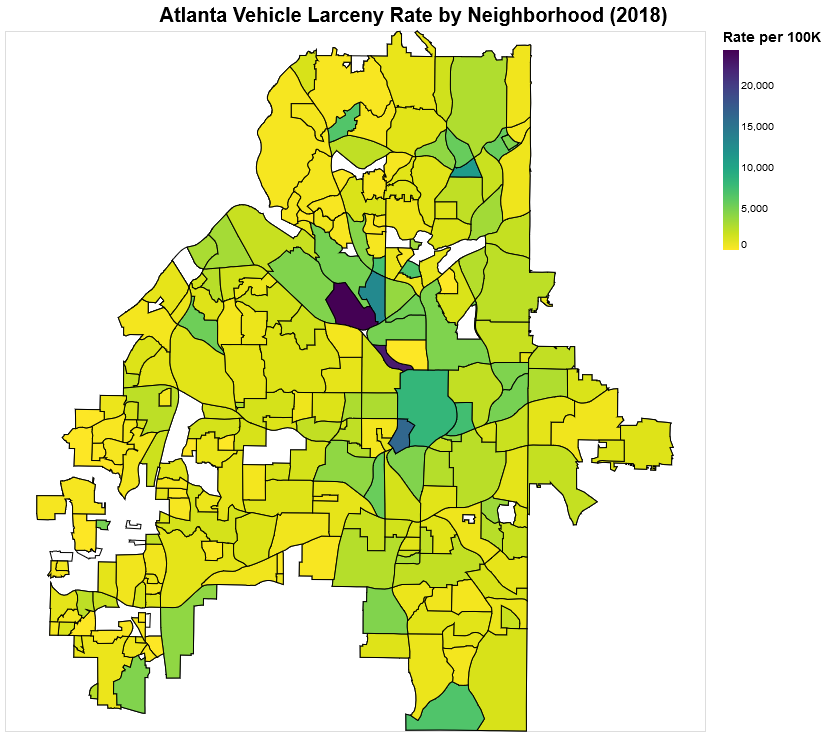

In [52]:
veh_larceny_map = gen_map(geodata=choro_data, color_column='properties.Larceny-From Vehicle Rate', 
                      title='Atlanta Vehicle Larceny Rate by Neighborhood (2018)', tooltip=[alt.Tooltip('properties.NAME:O', title="Neighborhood"), alt.Tooltip('properties.Larceny-From Vehicle Rate:Q', title="Vehicle Larceny Rate")], 
                      color_scheme='viridis')

veh_larceny_map

In [53]:
veh_larceny_map.save('veh_larceny_map.json')

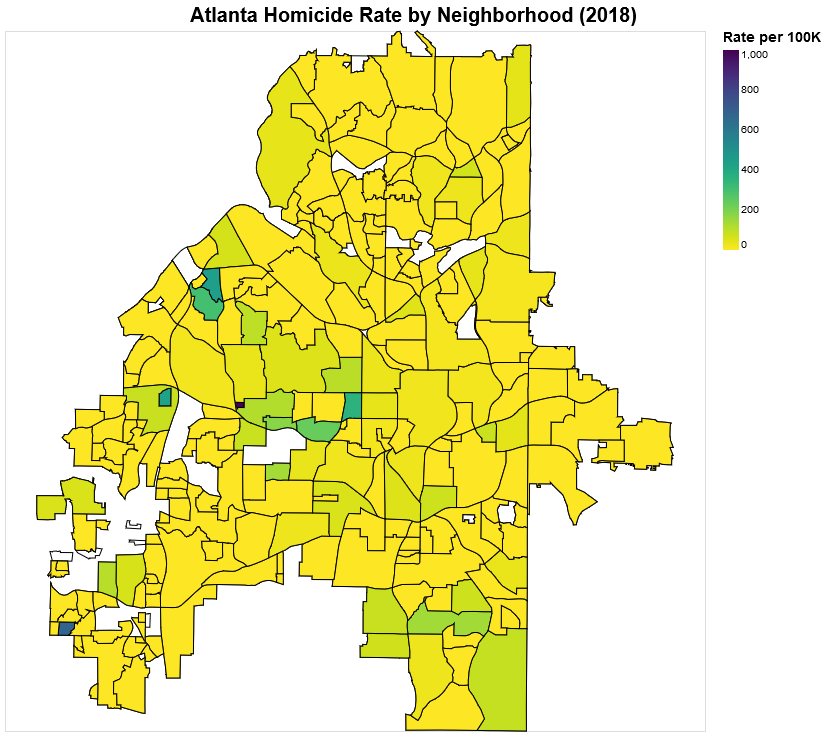

In [54]:
homicide_map = gen_map(geodata=choro_data, color_column='properties.Homicide Rate', 
                      title='Atlanta Homicide Rate by Neighborhood (2018)', tooltip=[alt.Tooltip('properties.NAME:O', title="Neighborhood"), alt.Tooltip('properties.Homicide Rate:Q', title="Rate per 100K")], 
                      color_scheme='viridis')

homicide_map

In [55]:
homicide_map.save('homicide_map.json')

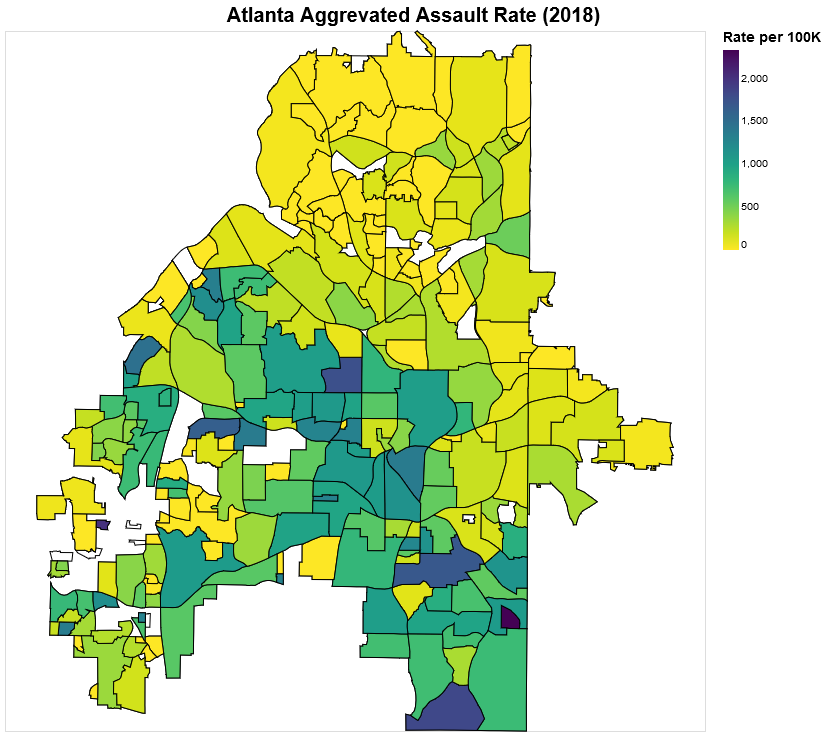

In [56]:
assault_map = gen_map(geodata=choro_data, color_column='properties.Agg Assault Rate', 
                      title='Atlanta Aggrevated Assault Rate (2018)', tooltip=[alt.Tooltip('properties.NAME:O', title="Neighborhood"), alt.Tooltip('properties.Agg Assault Rate:Q', title="Agg Assault Rate")], 
                      color_scheme='viridis')

assault_map

In [57]:
assault_map.save('assault_map.json')